<a href="https://colab.research.google.com/github/MariaPetrovskaya/Data-Science-demo/blob/main/Classification%20of%20EnglishText%20Complexity%20Word2Vec%20Tensorflow/%20Vers1_of_Classification_of_EnglishText_Complexity_Word2Vec_Tensorflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#About project

###Introduction

*   Watching films in the original language is a popular and effective method  for training languages skills.
*   It is important to choose a film that suits actual level of difficulty, (possible to understood 50-70% of the dialogues).
*   To fulfill this condition, the expert must watch the new film and decide what level it corresponds to. However, this requires a lot of time.


###Business task

*   Customer of this product: the foreign language courses.
*   Develop an ML solution (multi-class classification) for prediction of difficulty levels for English-language films.









###Initial data
*   The study was experimental stage, dataset was of limited size (200 + records).
*   Subtitles of films saved in directories with names as level of difficulty according to the CEFR ([Common European Framework of Reference]('https://ru.wikipedia.org/wiki/%D0%9E%D0%B1%D1%89%D0%B5%D0%B5%D0%B2%D1%80%D0%BE%D0%BF%D0%B5%D0%B9%D1%81%D0%BA%D0%B8%D0%B5_%D0%BA%D0%BE%D0%BC%D0%BF%D0%B5%D1%82%D0%B5%D0%BD%D1%86%D0%B8%D0%B8_%D0%B2%D0%BB%D0%B0%D0%B4%D0%B5%D0%BD%D0%B8%D1%8F_%D0%B8%D0%BD%D0%BE%D1%81%D1%82%D1%80%D0%B0%D0%BD%D0%BD%D1%8B%D0%BC_%D1%8F%D0%B7%D1%8B%D0%BA%D0%BE%D0%BC' 'wikipedia')).
*   Movie subtitles in XLSX files containing the name of the movies and the degree of difficulty according to the CEFR scale.






---



In [1]:
! pip install gensim # better to install this library first, if work in colab

In [2]:
# import modules & set up logging
import gensim, logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [3]:
import multiprocessing

from gensim.models import Word2Vec

In [4]:
from gensim import models

In [5]:
from gensim.utils import keep_vocab_item, call_on_class_only, deprecated
from gensim.models.keyedvectors import KeyedVectors, pseudorandom_weak_vector
from gensim import utils, matutils

# This import is required by pickle to load models stored by Gensim < 4.0, such as Gensim 3.8.3.
from gensim.models.keyedvectors import Vocab  # noqa

In [6]:
%%capture
# need to install in colab
!pip install pysrt

!pip install tabula-py


In [7]:
import tensorflow as tf

In [8]:
from string import punctuation

from collections import Counter
import matplotlib.pyplot as plt

from IPython.display import Image
from IPython.core.display import HTML
%matplotlib inline

In [9]:
# imports
import os
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import (train_test_split,
                                     StratifiedShuffleSplit,
                                     GridSearchCV
                                     )


from sklearn.metrics import (classification_report,
                             f1_score,
                             confusion_matrix,
                             ConfusionMatrixDisplay
                             )

from sklearn.base import (BaseEstimator,
                          TransformerMixin
                          )
import pickle
import pysrt

import requests
import urllib
import json
import zipfile
from zipfile import ZipFile
import tabula
from tabula import read_pdf


# Data Loading and Preprocessing



###Loadind data with movies

In [10]:
#import from с Google Disk to Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
PATH = '/content/drive/MyDrive/datasets'
path_to_zip_file = f'{PATH}/English_scores.zip'
path_to_zip_file

'/content/drive/MyDrive/datasets/English_scores.zip'

In [12]:
with ZipFile(path_to_zip_file, 'r') as zObject:
  znm = zObject.namelist()

In [13]:
with ZipFile(path_to_zip_file, 'r') as zObject:
  movies_labels = zObject.extract('movies_labels.xlsx')

In [14]:
#loading dataset with movies levels
df = pd.read_excel(movies_labels, index_col='id')
df.info

<bound method DataFrame.info of                                 Movie   Level
id                                           
0           10_Cloverfield_lane(2016)      B1
1    10_things_I_hate_about_you(1999)      B1
2                A_knights_tale(2001)      B2
3                A_star_is_born(2018)      B2
4                       Aladdin(1992)  A2/A2+
..                                ...     ...
236                     Matilda(2022)      C1
237                      Bullet train      B1
238            Thor: love and thunder      B2
239                         Lightyear      B2
240                        The Grinch      B1

[241 rows x 2 columns]>

In [15]:
# looking list of levels
df['Level'].unique()

array(['B1', 'B2', 'A2/A2+', 'C1', 'B1, B2', 'A2/A2+, B1', 'A2'],
      dtype=object)

In [16]:
# assign a numeric values to the levels
label_dict = {'A2': 1,
              'A2/A2+': 1,
              'B1': 2,
              'A2/A2+, B1': 2,
              'B2': 3,
              'B1, B2': 3,
              'C1': 4}
# change levels to numeric values
df['Level'] = df['Level'].replace(label_dict)

In [17]:
# drop duplicates
df = df.drop_duplicates()
df.shape

(238, 2)

###Loading subtitles

In [18]:
films_name = {}
for srt in znm:
  if srt.find('.srt') != -1 and srt.find('__MACOSX') == -1:
    films_name[srt.split('/')[-1]] = srt
print(len(films_name))

278


In [19]:
# checking number of films from table with subtitles
films_filtr = set(films_name.keys()) & set(df['Movie'] + '.srt')
len(films_filtr)

229

In [20]:
def load_subs(film):
  """loading subtitles function"""
  fsrt = f'{film}.srt'
  if fsrt not in set(films_name.keys()):
    return None
  with ZipFile(path_to_zip_file, 'r') as zObject:
    f = zObject.extract(films_name[fsrt])
    try:
      subs = pysrt.open(f)
    except:
      subs = pysrt.open(f,encoding='iso-8859-1')
  return subs

In [21]:
%%time
#loading subtitles
df['subs'] = df['Movie'].apply(load_subs)

CPU times: user 12.2 s, sys: 443 ms, total: 12.7 s
Wall time: 1min


<timed exec>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [22]:
df['subs']

id
0      [1\n00:00:55,279 --> 00:01:07,279\n<font color...
1      [1\n00:01:54,281 --> 00:01:55,698\nHey!\n, 2\n...
2      [1\n00:00:15,089 --> 00:00:21,229\nResync: Xen...
3      [1\n00:00:17,610 --> 00:00:22,610\n- <i><font ...
4      [1\n00:00:27,240 --> 00:00:30,879\n<i>Oh, I co...
                             ...                        
236                                                 None
237                                                 None
238                                                 None
239                                                 None
240                                                 None
Name: subs, Length: 238, dtype: object

In [23]:
#dropping gaps
df = df.dropna().reset_index(drop=True)

In [24]:
df

,Movie,Level,subs
0,10_Cloverfield_lane(2016),2,"[1\n00:00:55,279 --> 00:01:07,279\n<font color..."
1,10_things_I_hate_about_you(1999),2,"[1\n00:01:54,281 --> 00:01:55,698\nHey!\n, 2\n..."
2,A_knights_tale(2001),3,"[1\n00:00:15,089 --> 00:00:21,229\nResync: Xen..."
3,A_star_is_born(2018),3,"[1\n00:00:17,610 --> 00:00:22,610\n- <i><font ..."
4,Aladdin(1992),1,"[1\n00:00:27,240 --> 00:00:30,879\n<i>Oh, I co..."
...,...,...,...
225,Suits.S03E06.720p.HDTV.x264-mSD,4,"[1\n00:00:01,383 --> 00:00:02,751\nI lost Ava ..."
226,Suits.S03E07.HDTV.x264-mSD,4,"[1\n00:00:00,052 --> 00:00:01,352\nPreviously ..."
227,Suits.S03E08.480p.HDTV.x264-mSD,4,"[1\n00:00:01,436 --> 00:00:03,028\nI get Ava H..."
228,Suits.S03E09.480p.HDTV.x264-mSD,4,"[1\n00:00:00,024 --> 00:00:01,478\nPreviously ..."


###Data imbalances

In [25]:
df['Level'].value_counts()

Level
3    105
2     55
4     39
1     31
Name: count, dtype: int64

##Classification task


###Subtitle text preprocessing

In [26]:
# import re
def preprocess(text):
    tokens = re.sub('#+', ' ', text.lower()).split()
    tokens = [token.strip(punctuation) for token in tokens]
    tokens = [token for token in tokens if token]
    return tokens

При рассмотрении текстов после лемматизации были обнаружены лишние токены (например _x000В_), поэтому добавляется дополнительная функция обработки текста с помощью регулярных выражений.

In [27]:
# set regular expressions for text preprocessing
HTML = r'<.*?>' # html tags
#TAG = r'{.*?}' # change tags to spaces
COMMENTS = r'[\(\[][A-Za-z ]+[\)\]]' # comments in parentheses
LETTERS = r'[^\w\s]' # anything that isn't a letter
SPACES = r'([ ])\1+' # repeated spaces
DOTS = r'[\.]+' # punctuation mark ellipsis
SYMB = r"[^\w\d'\s]" # punctuation marks other than apostrophe
def clean_subs(subs):
  """subtitle text preprocessing"""
  subs = subs[1:] # remove the first promotional subtitle
  txt = re.sub(HTML, ' ', subs.text) # html tags change to spaces
  # txt = re.sub(COMMENTS, ' ', txt) # comments in parentheses change to spaces
  # txt = re.sub(LETTERS, ' ', txt) # anything that isn't a letter is a space
  # txt = re.sub(DOTS, r'.', txt) # punctuation mark ellipsis change to dots
  # txt = re.sub(SPACES, r'\1', txt) # repeated spaces change to one space
  # txt = re.sub(SYMB, '', txt) # punctuation marks other than apostrophe change to an empty string
  # txt = re.sub('www', '', txt) # 'www' change to an empty string
  # txt = txt.lstrip().rstrip().replace("\n","") # left space trimming
  # txt = txt.encode('ascii', 'ignore').decode() # remove all non-ascii characters
  #txt = txt.lower() # to lowercase
  txt = ' '.join(txt.split())
  return txt

In [28]:
df

,Movie,Level,subs
0,10_Cloverfield_lane(2016),2,"[1\n00:00:55,279 --> 00:01:07,279\n<font color..."
1,10_things_I_hate_about_you(1999),2,"[1\n00:01:54,281 --> 00:01:55,698\nHey!\n, 2\n..."
2,A_knights_tale(2001),3,"[1\n00:00:15,089 --> 00:00:21,229\nResync: Xen..."
3,A_star_is_born(2018),3,"[1\n00:00:17,610 --> 00:00:22,610\n- <i><font ..."
4,Aladdin(1992),1,"[1\n00:00:27,240 --> 00:00:30,879\n<i>Oh, I co..."
...,...,...,...
225,Suits.S03E06.720p.HDTV.x264-mSD,4,"[1\n00:00:01,383 --> 00:00:02,751\nI lost Ava ..."
226,Suits.S03E07.HDTV.x264-mSD,4,"[1\n00:00:00,052 --> 00:00:01,352\nPreviously ..."
227,Suits.S03E08.480p.HDTV.x264-mSD,4,"[1\n00:00:01,436 --> 00:00:03,028\nI get Ava H..."
228,Suits.S03E09.480p.HDTV.x264-mSD,4,"[1\n00:00:00,024 --> 00:00:01,478\nPreviously ..."


In [29]:
df['Level'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 230 entries, 0 to 229
Series name: Level
Non-Null Count  Dtype
--------------  -----
230 non-null    int64
dtypes: int64(1)
memory usage: 1.9 KB


In [30]:
df['clean_text'] = df.subs.apply(clean_subs)

In [31]:
df['norm_text'] = df.clean_text.apply(preprocess)

In [32]:
df

,Movie,Level,subs,clean_text,norm_text
0,10_Cloverfield_lane(2016),2,"[1\n00:00:55,279 --> 00:01:07,279\n<font color...",(CLANGING) (DRAWER CLOSES) (INAUDIBLE) (CELL P...,"[clanging, drawer, closes, inaudible, cell, ph..."
1,10_things_I_hate_about_you(1999),2,"[1\n00:01:54,281 --> 00:01:55,698\nHey!\n, 2\n...","I'll be right with you. So, Cameron. Here you ...","[i'll, be, right, with, you, so, cameron, here..."
2,A_knights_tale(2001),3,"[1\n00:00:15,089 --> 00:00:21,229\nResync: Xen...",Should we help him? He's due in the lists in t...,"[should, we, help, him, he's, due, in, the, li..."
3,A_star_is_born(2018),3,"[1\n00:00:17,610 --> 00:00:22,610\n- <i><font ...",Get to it. ♪ Black eyes open wide It's time to...,"[get, to, it, ♪, black, eyes, open, wide, it's..."
4,Aladdin(1992),1,"[1\n00:00:27,240 --> 00:00:30,879\n<i>Oh, I co...",Where the caravan camels roam Where it's flat ...,"[where, the, caravan, camels, roam, where, it'..."
...,...,...,...,...,...
225,Suits.S03E06.720p.HDTV.x264-mSD,4,"[1\n00:00:01,383 --> 00:00:02,751\nI lost Ava ...",I assume my deal with Edward is dead. As long ...,"[i, assume, my, deal, with, edward, is, dead, ..."
226,Suits.S03E07.HDTV.x264-mSD,4,"[1\n00:00:00,052 --> 00:00:01,352\nPreviously ...",It's going up on the wall tomorrow... And this...,"[it's, going, up, on, the, wall, tomorrow, and..."
227,Suits.S03E08.480p.HDTV.x264-mSD,4,"[1\n00:00:01,436 --> 00:00:03,028\nI get Ava H...",Darby backs me for managing partner. I don't w...,"[darby, backs, me, for, managing, partner, i, ..."
228,Suits.S03E09.480p.HDTV.x264-mSD,4,"[1\n00:00:00,024 --> 00:00:01,478\nPreviously ...",I'm bonding with your father here. - Speaking ...,"[i'm, bonding, with, your, father, here, speak..."


### Word2Vec for embedding

Word vectors: will use **Word2Vec** to train word embeddings, using **gensim**,   NLP library that features many vector-based models incuding word2vec.

The input must be a tokenized text

In [33]:
all_text = ' '.join(df['clean_text'])

In [34]:
all_text

'(CLANGING) (DRAWER CLOSES) (INAUDIBLE) (CELL PHONE RINGING) BEN ON PHONE: Michelle, please don\'t hang up. Just talk to me, okay? I can\'t believe you just left. Michelle. Come back. Please say something. Michelle, talk to me. Look, we had an argument. Couples fight. That is no reason to just leave everything behind. Running away isn\'t gonna help it any. Michelle, please... (DIALTONE) NEWSCASTER: More details on that. Elsewhere today, power has still not been restored to many cities on the southern seaboard in the wake of this afternoon\'s widespread blackout. While there had been some inclement weather in the region, the problem seems linked to what authorities are calling a catastrophic power surge that has crippled traffic in the area. - (LOUD CRASH) - (GRUNTS) - (TIRES SCREECHING) - (SCREAMS) - (GLASS SHATTERING) - (GASPING) (GROANS) (HORN HONKING) (INHALES DEEPLY) (SNIFFS) (SIGHS) (GASPING) (CHAINS RATTLING) (BREATHING HEAVILY) (GRUNTING) (GROANING) (GROANING) (GRUNTING) (SOBS) 

In [35]:
texts = [preprocess(text) for text in df['clean_text']]

In [36]:
texts

[['clanging',
  'drawer',
  'closes',
  'inaudible',
  'cell',
  'phone',
  'ringing',
  'ben',
  'on',
  'phone',
  'michelle',
  'please',
  "don't",
  'hang',
  'up',
  'just',
  'talk',
  'to',
  'me',
  'okay',
  'i',
  "can't",
  'believe',
  'you',
  'just',
  'left',
  'michelle',
  'come',
  'back',
  'please',
  'say',
  'something',
  'michelle',
  'talk',
  'to',
  'me',
  'look',
  'we',
  'had',
  'an',
  'argument',
  'couples',
  'fight',
  'that',
  'is',
  'no',
  'reason',
  'to',
  'just',
  'leave',
  'everything',
  'behind',
  'running',
  'away',
  "isn't",
  'gonna',
  'help',
  'it',
  'any',
  'michelle',
  'please',
  'dialtone',
  'newscaster',
  'more',
  'details',
  'on',
  'that',
  'elsewhere',
  'today',
  'power',
  'has',
  'still',
  'not',
  'been',
  'restored',
  'to',
  'many',
  'cities',
  'on',
  'the',
  'southern',
  'seaboard',
  'in',
  'the',
  'wake',
  'of',
  'this',
  "afternoon's",
  'widespread',
  'blackout',
  'while',
  'there'

In [37]:
gensim.__version__

'4.3.2'

It is necessary to transfer the corpus for training to model; for other parameters there are default values.

In [38]:
%%time
w2v = gensim.models.Word2Vec(texts, )

CPU times: user 20.7 s, sys: 111 ms, total: 20.8 s
Wall time: 12.4 s


To check the model work

In [39]:
w2v.wv.most_similar('future')

[('marriage', 0.7575587034225464),
 ('spark', 0.6942643523216248),
 ('career', 0.6875650882720947),
 ('freedom', 0.6771364808082581),
 ('opinion', 0.6754093170166016),
 ('secretary', 0.6719285845756531),
 ('strength', 0.6512789130210876),
 ('fiancã©e', 0.6484445333480835),
 ('condolences', 0.6473358869552612),
 ('happiness', 0.6456720232963562)]

In [40]:
%%time
w2v = gensim.models.Word2Vec(texts,
                             vector_size=300,
                             min_count=30,
                             max_vocab_size=10000,
                             window=5,
                             epochs=7)

CPU times: user 35.3 s, sys: 241 ms, total: 35.5 s
Wall time: 24.5 s


In [41]:
w2v.wv.most_similar('future')

[('thoughts', 0.5663193464279175),
 ('fate', 0.5515978336334229),
 ('marriage', 0.5507354140281677),
 ('family', 0.5398064255714417),
 ('career', 0.5309712886810303),
 ('hearts', 0.529026448726654),
 ('memory', 0.507465660572052),
 ('opinion', 0.5055086016654968),
 ('laundry', 0.4941891133785248),
 ('freedom', 0.49403682351112366)]

At next step we collect the dictionary

In [42]:
vocab = Counter()

for text in df['norm_text']:
    vocab.update(text)

filtered_vocab = set()

for word in vocab:
    if vocab[word] > 5:
        filtered_vocab.add(word)

len(filtered_vocab)

10561

In [43]:
word2id = { 'PAD':0}

for word in filtered_vocab:
    word2id[word] = len(word2id)
id2word = {i:word for word, i in word2id.items()}

Next step is to set indexes for tokens

In [44]:
X = []

for tokens in df['norm_text']:
    ids = [word2id[token] for token in tokens if token in word2id]
    X.append(ids)

###Splitting data into training and test samples

In [45]:
X = tf.keras.preprocessing.sequence.pad_sequences(X, maxlen=100)
y = df.Level.values

In [46]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.05)

###TensorFlow model

In [47]:
inputs = tf.keras.layers.Input(shape=(100,))

embeddings = tf.keras.layers.Embedding(input_dim=len(word2id), output_dim=100)(inputs, )
# embedding layer returns a sequence of vectors
# in this task we need to classify all text at once
# for this will get mean of single vectors as 1 text vector
mean = tf.keras.layers.Lambda(lambda x: tf.keras.backend.mean(x,  axis=1))(embeddings)
# mean vector, fully connected layer, return the class probability
outputs = tf.keras.layers.Dense(5, activation='softmax')(mean)

model = tf.keras.Model(inputs=inputs, outputs=outputs)
optimizer = tf.keras.optimizers.Adam()
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['sparse_categorical_accuracy'])

In [48]:
model.fit(X_train, y_train,
          validation_data=(X_valid, y_valid),
          batch_size=32,
         epochs=10)

Epoch 1/10
7/7 [==============================] - 1s 65ms/step - loss: 1.6021 - sparse_categorical_accuracy: 0.3853 - val_loss: 1.5863 - val_sparse_categorical_accuracy: 0.5833
Epoch 2/10
7/7 [==============================] - 0s 27ms/step - loss: 1.5761 - sparse_categorical_accuracy: 0.4587 - val_loss: 1.5614 - val_sparse_categorical_accuracy: 0.5833
Epoch 3/10
7/7 [==============================] - 0s 32ms/step - loss: 1.5488 - sparse_categorical_accuracy: 0.4495 - val_loss: 1.5351 - val_sparse_categorical_accuracy: 0.5833
Epoch 4/10
7/7 [==============================] - 0s 30ms/step - loss: 1.5206 - sparse_categorical_accuracy: 0.4495 - val_loss: 1.5049 - val_sparse_categorical_accuracy: 0.5833
Epoch 5/10
7/7 [==============================] - 0s 29ms/step - loss: 1.4885 - sparse_categorical_accuracy: 0.4495 - val_loss: 1.4744 - val_sparse_categorical_accuracy: 0.5833
Epoch 6/10
7/7 [==============================] - 0s 29ms/step - loss: 1.4551 - sparse_categorical_accuracy: 0.4495

In this model, vector representations are training from scratch.  To make it better, we can add pretrained vectors from word2vec to the embedding layer

In [49]:
%%time
ft = gensim.models.Word2Vec(texts + df['norm_text'].values.tolist(), window=10, epochs=200) #epochs=1000 same result

CPU times: user 30min 49s, sys: 8.84 s, total: 30min 58s
Wall time: 18min 42s


Forming the matrix with vectors. The indices of the rows in this matrix are similar with the indices of the words in the dictionary.

In [50]:
weights = np.zeros((len(word2id), 100))

for word, i in word2id.items():
    # padding vector as zero
    if word == 'PAD':
        continue

    try:
        weights[i] = ft.wv[word]


    except KeyError:
        # for words that are not in the models, set some random vector
        continue
        weights[i] = ft.wv['rwwatandomhm']

In [51]:
inputs = tf.keras.layers.Input(shape=(100,))

# enter matrix to the embedding layer
# set trainable=False, so that vectors don’t learn
# Note: if this is not done, embedding will learn again

embeddings = tf.keras.layers.Embedding(input_dim=len(word2id), output_dim=100,
                                       trainable=False,
                                       weights=[weights])(inputs, )
mean = tf.keras.layers.Lambda(lambda x: tf.keras.backend.mean(x,  axis=1))(embeddings)

outputs = tf.keras.layers.Dense(5, activation='softmax')(mean)

model = tf.keras.Model(inputs=inputs, outputs=outputs)
optimizer = tf.keras.optimizers.Adam()
model.compile(optimizer=optimizer,
              loss='SparseCategoricalCrossentropy',
              metrics=['sparse_categorical_accuracy'])

In [55]:
model.fit(X_train, y_train,
          validation_data=(X_valid, y_valid),
          batch_size=32,
         epochs=30)

Epoch 1/30
7/7 [==============================] - 0s 24ms/step - loss: 0.9874 - sparse_categorical_accuracy: 0.5505 - val_loss: 0.8191 - val_sparse_categorical_accuracy: 0.5833
Epoch 2/30
7/7 [==============================] - 0s 11ms/step - loss: 0.9807 - sparse_categorical_accuracy: 0.5596 - val_loss: 0.8151 - val_sparse_categorical_accuracy: 0.5833
Epoch 3/30
7/7 [==============================] - 0s 14ms/step - loss: 0.9740 - sparse_categorical_accuracy: 0.5688 - val_loss: 0.8136 - val_sparse_categorical_accuracy: 0.5833
Epoch 4/30
7/7 [==============================] - 0s 17ms/step - loss: 0.9675 - sparse_categorical_accuracy: 0.5826 - val_loss: 0.8092 - val_sparse_categorical_accuracy: 0.6667
Epoch 5/30
7/7 [==============================] - 0s 11ms/step - loss: 0.9612 - sparse_categorical_accuracy: 0.5826 - val_loss: 0.8085 - val_sparse_categorical_accuracy: 0.5833
Epoch 6/30
7/7 [==============================] - 0s 15ms/step - loss: 0.9569 - sparse_categorical_accuracy: 0.5917

dict_keys(['loss', 'sparse_categorical_accuracy', 'val_loss', 'val_sparse_categorical_accuracy'])


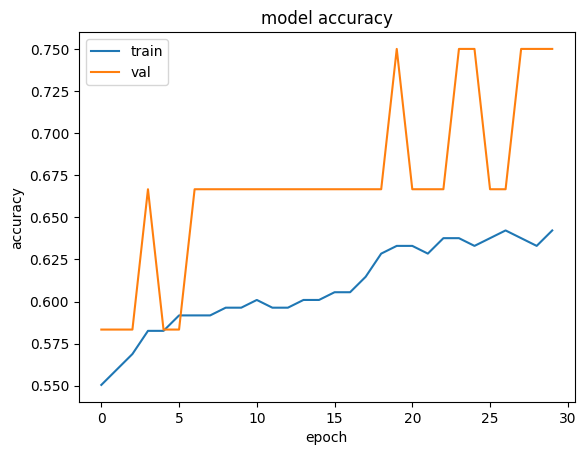

In [56]:
print(model.history.history.keys())
# summarize history for accuracy
plt.plot(model.history.history['sparse_categorical_accuracy'])
plt.plot(model.history.history['val_sparse_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

The resulting metric sparse_categorical_accuracy = 0,75 is not bad for a small experimental dataset (230 items)

#Summary results

#### Conclusions
- The project is completed.
- Data was loaded and unpacked.
- Text data was preprocessed by .re (Regular expression operations).
- Word2Vec embeddings were trained using gensim library.
- A solution with TensorFlow has been implemented  ( using pretrained Word2Vec embeddings and also without them).
- The sparse_categorical_accuracy metric on validation was 0,75.
- To build a model with better metrics and practical application, a larger dataset is desirable.  

